In [ ]:
# EDA
# pandas -> Covid의 전처리 시각화 -> EDA
# Exploratory Data Analysis -> 탐색적 데이터 분석
# 방대한 빅데이터를 다루다 보면, 해당 데이터를 실제 전처리 하기 전에 데이터의 형태, 신뢰도, 상관관계 등을 분석한 상태에서 작업을 실행하는 효율이 높아진다.
# 마케팅 팀 -> 데이터 팀
# 수집 / 저장 / 어떻게 시각화? / 그래프

In [1]:
# 탐색적 데이터 분석
# 1. 데이터의 출처 & 주제에 대한 이해 -> 국가 / 도시 / 확진자 / 사망자 / 회복 / 현재
# 2. 데이터의 크기 -> 모수 -> 신뢰도 -> 대표성
# 3. 데이터 구성 요소 (column | feature)의 독립적인 속성특징 & 상관관계 확인 및 분석

# 탐색적 데이터 분석 결론 (*주요포인트) : feature 데이터를 어떻게 더 깊이 있게 분석하고 이해할 수 있는가?

In [ ]:
# feature 데이터의 깊이 있는 분석을 하기 위한 방법론적인 것이 존재함!

# 1) 위치추정 : 현재 확보한 방대한 데이터의 대표값을 산출해서 해당 feature의 요약정보를 도출
#    => 평균값 혹은 중앙값 등을 활용해서 해당 수치 데이터가 무엇을 의미하는지 판단

# [1, 2, 3, 100] = 4개의 숫자를 모두 더한 후 4로 나눈 숫자가 우리가 알고 있는 상식적인 평균
# 평균(mean) = 일반평균 = feature를 대표하는 평균
# 가중평균 (weighted mean) = 수집한 데이터 가운데 신뢰도가 있거나 없는 정도에 따라서 가중치를 상이하게 준 후 평균값을 산출
# 가중평균의 리스크 : 가중치를 적용 / 결정하는 판단 기준에 대한 신뢰도가 매우 중요

# 중간값 = 중앙값(median) = 전체 데이터를 정렬한 다음, 중간에 위치한 값을 취합함 (*보통 일반적으로 많이 사용)
# 중간값의 가장 큰 장점 : 특이값(outlier)의 영향을 최대한 받지 않는다

# 절사평균 = 최상위값, 최하위값에 데이터들이 몰려있는 경우 -> 특정 집단에 의해서 평균값이 왜곡될 수 있음 -> 최상위값 & 최하위값을 절사
# 강남 8학군 고등학생 => 평균 학습시간

# 2) 변이추정 : 현재 확보한 방대한 데이터의 분포 (밀집 여부)를 확인 후 해당 feature의 요약정보를 도출
#    => 표준편차 혹은 분산 & 분포

# 분산 (variance)
# => 평균과 각 데이터간의 차를 제곱한 값들의 합을 데이터 개수로 나눈 값
# => 모분산 | 표본분산
# => 모분산 : 데이터 개수 전체를 기준으로 분산값을 계산한 방식
# => 표본분산 : 분모의 값을 데이터 총개수 -1 한 값

# 표준편차 (standard deviation)
# => 분산의 수치가 너무 커지기 때문에, 분산의 제곱근을 활용한 결과 값

# 분산 => 편차 제곱의 평균
# 왜 굳이 제곱? 더 많은 모수 확보를 통해서 오차정도를 낮추기 위한 목적

# 표준편차 => 분산의 제곱근, 분산의 값이 제곱단위로 결정되기 때문에 워낙 방대한 양
# => 데이터가 평균에서 평균적으로 얼만큼 떨어져 있는지 확인

# 표준편차가 클수록 평균에서 상대적으로 많이 떨어져있다.
# 표준편차가 작을수록 평균에 가까이 있다.


In [ ]:
# EDA를 하기 전에 판단해야하는 데이터 분류

# 1) 수치형 데이터
# - 연속형 (continuous) 데이터 : 특정한 범위 안에서 어떤 값 (*정수, 실수)을 가질 수 있는 데이터
# - 이산 (discrete) 데이터 : 카운트와 같은 횟수 등의 정수값만 가질 수 있는 데이터
# 탐색적 데이터 분석을 초반에 할 때, 수치형 데이터 여부를 판단하려고 한다면 => 사분위 데이터!!!
# 5 Number Summary
# 최소값, 1사분위수, 중앙값, 3사분위수, 최대값
# Box Plot
# 도수분포표 (frequency table) : "수치형 데이터"를 구간으로 나눠서 각 구간에 속하는 데이터의 갯수를 취합한 테이블
# 히스토그램 (histogram) : "도수분포표"를 시각적으로 표현한 그래프

# 2) 범주형 데이터
# - 명목형 데이터 (nominal) : 카테고리, 타입, 항목 등 데이터 분류를 위해 이미 정해진 값이 있는 데이터 => 해당 데이터가 가질 수 있는 값의 수준 levels
# (이진 binary 데이터) => 0, 1 
# - 순서형 데이터 : 이미 정해진 값 사이의 순서 관계가 존재하는 데이터
# 매우불만 (1) ~ 매우만족 (5)
# 범주형 데이터 => 순서형 혹은 명목형 모두 범주안에 들어있는 각각의 데이터를 수준(levels)에 따라서 분류
# 매우불만 : 5, 만족 7
# 수준에 따라서 데이터를 분류 및 시각화할 때, 2가지 형태로 나눠서 사용
#     - 절대빈도 : 절대적인 갯수
#     - 상대빈도 : 각각의 데이터를 모두 더했을 때, 그 가운데에서의 비율(%)

# 3) 시계열 데이터
# - 일정 시간 간격으로 배치된 데이터 (시간에 종속된 데이터)
# 반드시 시간의 시작과 끝이 존재함
# 화면상에 효율적으로 출력하고자 할 때, 많이 사용하는 그래프 : 라인 & 막대그래프

In [2]:
import pandas as pd

df = pd.DataFrame({
    "A":[1,2,3,4,5,6],
    "B":[1,2,3,4,5,100]
})

df.describe()

,A,B
count,6.000000,6.000000
mean,3.500000,19.166667
std,1.870829,39.625329
min,1.000000,1.000000
25%,2.250000,2.250000
50%,3.500000,3.500000
75%,4.750000,4.750000
max,6.000000,100.000000


In [4]:
import plotly.express as px
import numpy as np

df = pd.DataFrame(np.random.rand(100000, 1), columns=["A"])

df.head()

,A
0,0.553522
1,0.393854
2,0.785103
3,0.215447
4,0.686685


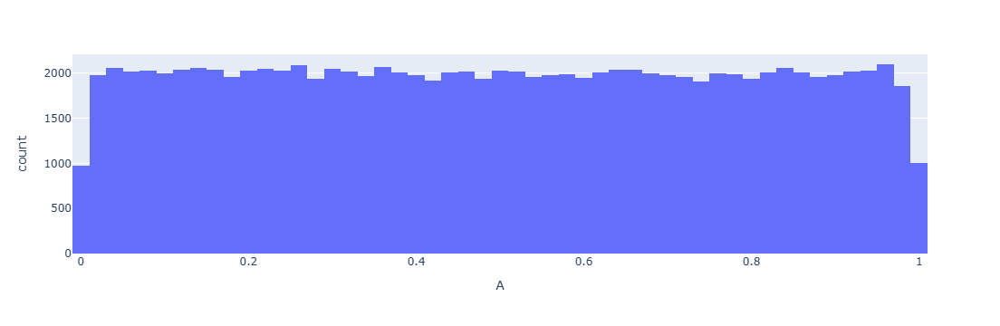

In [8]:
import plotly.express as px

fig = px.histogram(
    df,
    x="A",
    nbins=50
)

fig.show()


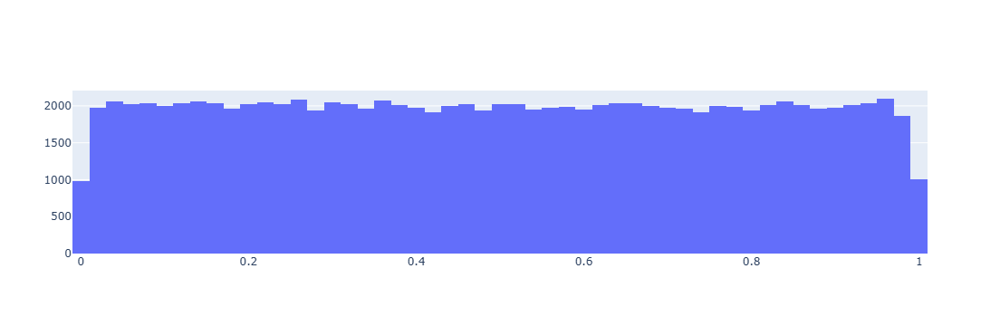

In [7]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(
    go.Histogram(
        x=df["A"],
        nbinsx=50
    )
)

fig.show()

In [9]:
import pandas as pd

data = {
    "year" : ["2017", "2017", "2019", "2020", "2021", "2026"],
    "grade" : ["C","C","B","A","B","E"]
}

df = pd.DataFrame(data)

In [10]:
df["year"].value_counts()

year
2017    2
2019    1
2020    1
2021    1
2026    1
Name: count, dtype: int64

In [12]:
df["year"].size

6

In [16]:
df["year"].count()

np.int64(6)

In [17]:
df["year"].unique()

array(['2017', '2019', '2020', '2021', '2026'], dtype=object)

In [19]:
df.groupby("year").sum()

,grade
year,
2017,CC
2019,B
2020,A
2021,B
2026,E


In [20]:
df1=df.groupby("grade").count()
df1

,year
grade,
A,1
B,2
C,2
E,1


In [21]:
df2 = df.groupby("year").count()
df2

,grade
year,
2017,2
2019,1
2020,1
2021,1
2026,1


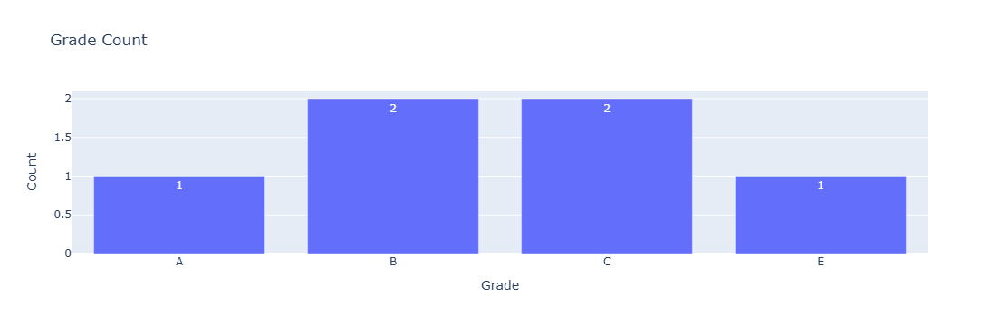

In [24]:
import plotly.express as px

fig = px.bar(
    x = df1.index,
    y = df1["year"],
    title = "Grade Count",
    labels = {"x": "Grade", "y": "Count"},
    text = df1["year"]
)

fig.show()

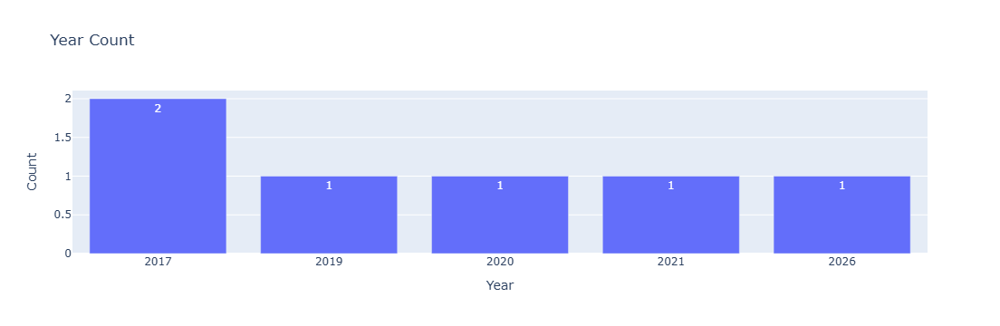

In [27]:
import plotly.express as px

fig = px.bar(
    x = df2.index,
    y = df2["grade"],
    title = "Year Count",
    labels = {"x": "Year", "y": "Count"},
    text = df2["grade"]
)

fig.show()

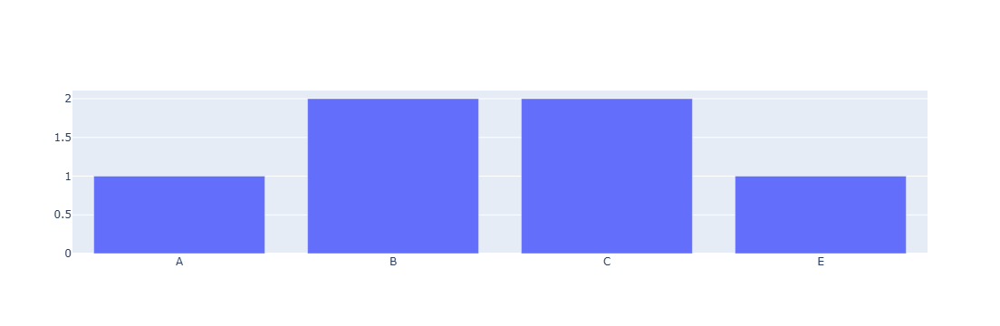

In [28]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=df1.index,
        y=df1["year"]
    )
)

fig.show()

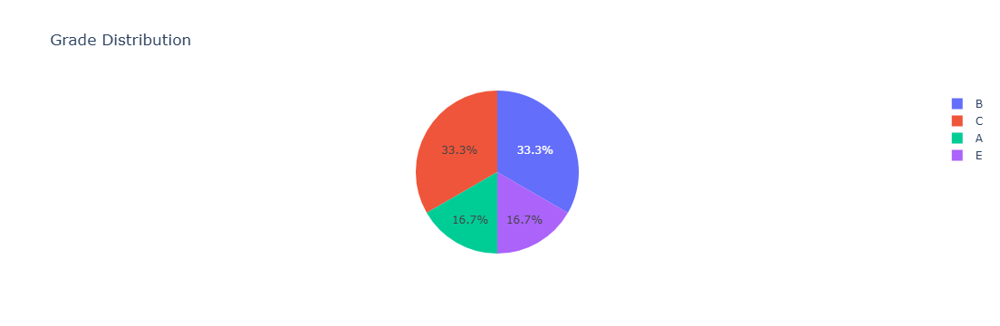

In [30]:
import plotly.express as px

fig = px.pie(
    values = df1["year"],
    names = df1.index,
    title = "Grade Distribution"
)

fig.show()

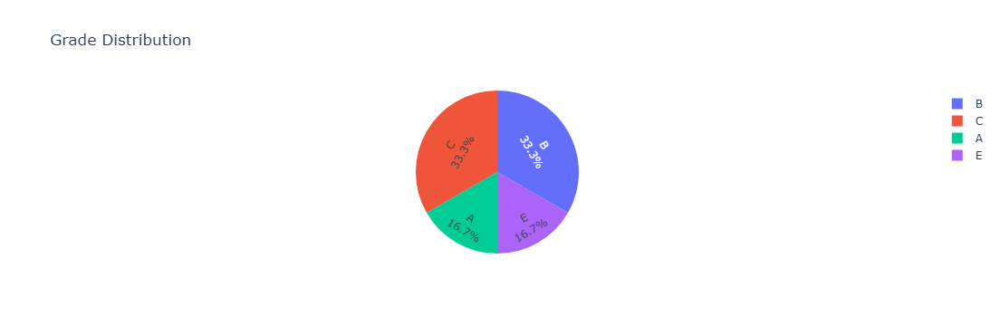

In [34]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Pie(
        labels = df1.index,
        values=df1["year"],
        textinfo="label+percent",
        insidetextorientation="tangential" # radial : 각도가 꺾이는 요소들을 방사형, horizontal : 수평, tangential : 전부 꺾음
    )
)

fig.update_layout(title_text = "Grade Distribution")
fig.show()

In [37]:
import pandas as pd

pd.date_range(start="2020-01-01", end="2020-12-31")

DatetimeIndex(['2020-01-01', '2020-01-02', '2020-01-03', '2020-01-04',
               '2020-01-05', '2020-01-06', '2020-01-07', '2020-01-08',
               '2020-01-09', '2020-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', length=366, freq='D')

In [39]:
pd.date_range(start="2020-01-01", end="2020-12-31", freq="3ME")

DatetimeIndex(['2020-01-31', '2020-04-30', '2020-07-31', '2020-10-31'], dtype='datetime64[ns]', freq='3ME')

### freq
- ME : Month and Frequency
- QE : Quarter and Frequency
- YE : Year and Frequency
- D : Calendar and Frequency
- h : Hourly and Frequency
- min : Minutely and Frequency
- s : Secondly and Frequency

### 주요 날짜 포맷
- %Y : 4자리 연도
- %y : 2자리 연도
- %m : 2자리 월
- %d : 2자리 일
- %B : 전체 월 이름 (January, February …)
- %b : 축약 월 이름 (Jan, Feb …)
- %A : 전체 요일 이름 (Monday, Tuesday …)
- %a : 축약 요일 이름 (Mon, Tue …)
- %H : 24시간제 시 (00–23)
- %I : 12시간제 시 (01–12)
- %p : AM/PM
- %M : 분 (00–59)
- %S : 초 (00–59)

In [44]:
date_index = pd.date_range(start = "2026-01-01", end = "2026-01-31", freq = "2D")
df = pd.DataFrame(data = range(len(date_index)), columns = ["count"], index = date_index)

df

,count
2026-01-01,0
2026-01-03,1
2026-01-05,2
2026-01-07,3
2026-01-09,4
2026-01-11,5
2026-01-13,6
2026-01-15,7
2026-01-17,8
2026-01-19,9


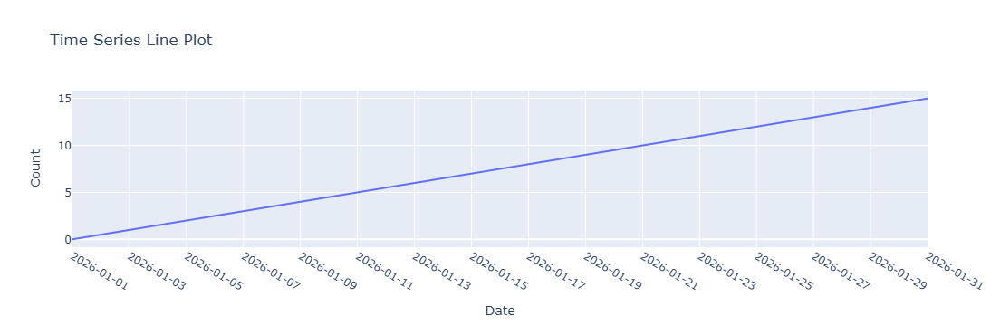

In [50]:
import plotly.express as px

fig_line = px.line(
    df,
    x=df.index,
    y="count",
    title="Time Series Line Plot"
) 

fig_line.update_xaxes(title="Date")
fig_line.update_yaxes(title="Count")

fig_line.update_xaxes(
    # tickmode="linear",
    # tickangle = 45,
    tickmode="array",
    tickvals=df.index,
    ticktext = [date.strftime("%Y-%m-%d") for date in df.index]
)

fig_line.show()

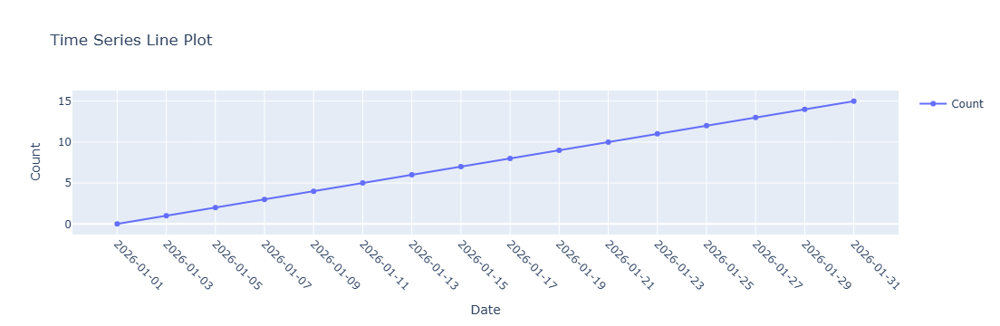

In [58]:
import plotly.graph_objects as go

fig_go_line = go.Figure()

fig_go_line.add_trace(
    go.Scatter(
        x=df.index,
        y=df["count"],
        mode="lines+markers",
        name="Count",
        showlegend=True
    )
)

fig_go_line.update_layout(
    title = "Time Series Line Plot",
    xaxis_title = "Date",
    yaxis_title = "Count"
)

fig_go_line.update_xaxes(
    tickmode = "array",
    tickvals = df.index,
    ticktext = [date.strftime("%Y-%m-%d") for date in df.index],
    tickangle = 45
)
fig_go_line.show()